In [0]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


manualSeed = 999

print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


In [0]:
dataroot = "/content/drive/My Drive/Colab Notebooks/dataset/*.jpg"
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 50
lr = 0.0005
beta1 = 0.5
ngpu = 1

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
dataroot = "/content/drive/My Drive/Colab Notebooks/dataset"

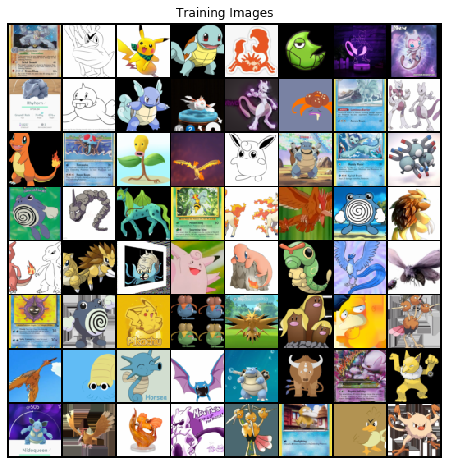

In [0]:


# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))


In [0]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [0]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)


In [0]:

netG = Generator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu))).
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTrans

In [0]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [0]:

netD = Discriminator(ngpu).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [0]:

criterion = nn.BCELoss()
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [0]:
# Training Loop


img_list = []
G_losses = []
D_losses = []
iters = 0
print("Starting Training Loop...")
for epoch in range(num_epochs):
    
    if epoch%5==0:
      lr-=0.1*lr
    for i, data in enumerate(dataloader, 0):

        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))   
      
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][0/151]	Loss_D: 1.8909	Loss_G: 12.0762	D(x): 0.4789	D(G(z)): 0.5702 / 0.0000


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[0/50][50/151]	Loss_D: 1.0999	Loss_G: 4.4845	D(x): 0.8291	D(G(z)): 0.4064 / 0.0488
[0/50][100/151]	Loss_D: 0.5353	Loss_G: 4.5797	D(x): 0.7032	D(G(z)): 0.0935 / 0.0148
[0/50][150/151]	Loss_D: 0.4595	Loss_G: 3.3346	D(x): 0.7107	D(G(z)): 0.0629 / 0.0921
[1/50][0/151]	Loss_D: 0.6790	Loss_G: 3.2499	D(x): 0.8287	D(G(z)): 0.3151 / 0.0765


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[1/50][50/151]	Loss_D: 0.6995	Loss_G: 2.9623	D(x): 0.7219	D(G(z)): 0.2473 / 0.0734


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[1/50][100/151]	Loss_D: 0.9131	Loss_G: 2.8591	D(x): 0.7956	D(G(z)): 0.4440 / 0.0790
[1/50][150/151]	Loss_D: 0.2755	Loss_G: 5.5952	D(x): 0.8488	D(G(z)): 0.0719 / 0.0125
[2/50][0/151]	Loss_D: 0.5668	Loss_G: 3.1691	D(x): 0.7800	D(G(z)): 0.1182 / 0.0859


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[2/50][50/151]	Loss_D: 1.0298	Loss_G: 2.3732	D(x): 0.5442	D(G(z)): 0.2075 / 0.1502
[2/50][100/151]	Loss_D: 1.0454	Loss_G: 2.6985	D(x): 0.6810	D(G(z)): 0.3193 / 0.1479
[2/50][150/151]	Loss_D: 0.4539	Loss_G: 3.9775	D(x): 0.8681	D(G(z)): 0.2230 / 0.0245
[3/50][0/151]	Loss_D: 0.3939	Loss_G: 2.9245	D(x): 0.7740	D(G(z)): 0.0751 / 0.0672
[3/50][50/151]	Loss_D: 1.2343	Loss_G: 2.8750	D(x): 0.7513	D(G(z)): 0.5105 / 0.1220


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[3/50][100/151]	Loss_D: 1.2295	Loss_G: 5.4658	D(x): 0.9350	D(G(z)): 0.6127 / 0.0092


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[3/50][150/151]	Loss_D: 0.8303	Loss_G: 2.3979	D(x): 0.6624	D(G(z)): 0.2367 / 0.1305
[4/50][0/151]	Loss_D: 1.1589	Loss_G: 2.5274	D(x): 0.6941	D(G(z)): 0.4293 / 0.1425


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[4/50][50/151]	Loss_D: 0.4637	Loss_G: 3.7105	D(x): 0.8607	D(G(z)): 0.2460 / 0.0337


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[4/50][100/151]	Loss_D: 1.3422	Loss_G: 2.1397	D(x): 0.6032	D(G(z)): 0.4966 / 0.1416
[4/50][150/151]	Loss_D: 0.8988	Loss_G: 1.6534	D(x): 0.6201	D(G(z)): 0.2977 / 0.2143
[5/50][0/151]	Loss_D: 1.1711	Loss_G: 1.8880	D(x): 0.6429	D(G(z)): 0.4476 / 0.1883


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[5/50][50/151]	Loss_D: 0.7364	Loss_G: 2.8254	D(x): 0.7718	D(G(z)): 0.3139 / 0.0861
[5/50][100/151]	Loss_D: 1.0189	Loss_G: 1.6554	D(x): 0.4902	D(G(z)): 0.1292 / 0.2410
[5/50][150/151]	Loss_D: 0.6155	Loss_G: 2.7482	D(x): 0.7503	D(G(z)): 0.2464 / 0.0816
[6/50][0/151]	Loss_D: 1.2138	Loss_G: 0.7680	D(x): 0.4654	D(G(z)): 0.2540 / 0.5074


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[6/50][50/151]	Loss_D: 1.1772	Loss_G: 0.8888	D(x): 0.4286	D(G(z)): 0.1048 / 0.5047
[6/50][100/151]	Loss_D: 0.9950	Loss_G: 4.1788	D(x): 0.8698	D(G(z)): 0.5105 / 0.0352
[6/50][150/151]	Loss_D: 0.8715	Loss_G: 4.0889	D(x): 0.8630	D(G(z)): 0.4337 / 0.0260
[7/50][0/151]	Loss_D: 0.9624	Loss_G: 2.0110	D(x): 0.5378	D(G(z)): 0.1354 / 0.1949


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[7/50][50/151]	Loss_D: 0.8247	Loss_G: 2.6494	D(x): 0.5910	D(G(z)): 0.1516 / 0.1189


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[7/50][100/151]	Loss_D: 0.8968	Loss_G: 2.3103	D(x): 0.6202	D(G(z)): 0.2466 / 0.1373
[7/50][150/151]	Loss_D: 1.3999	Loss_G: 1.7421	D(x): 0.5211	D(G(z)): 0.3523 / 0.2982
[8/50][0/151]	Loss_D: 2.1229	Loss_G: 5.8222	D(x): 0.8909	D(G(z)): 0.7569 / 0.0060


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[8/50][50/151]	Loss_D: 0.4592	Loss_G: 2.6949	D(x): 0.7054	D(G(z)): 0.0600 / 0.0998
[8/50][100/151]	Loss_D: 1.2128	Loss_G: 2.1605	D(x): 0.4678	D(G(z)): 0.2154 / 0.1664


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[8/50][150/151]	Loss_D: 1.2411	Loss_G: 3.1538	D(x): 0.6338	D(G(z)): 0.4174 / 0.0807
[9/50][0/151]	Loss_D: 0.7649	Loss_G: 3.5909	D(x): 0.7905	D(G(z)): 0.3235 / 0.0430


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[9/50][50/151]	Loss_D: 1.6621	Loss_G: 1.2329	D(x): 0.3742	D(G(z)): 0.2479 / 0.3915
[9/50][100/151]	Loss_D: 0.6697	Loss_G: 4.9076	D(x): 0.8717	D(G(z)): 0.3464 / 0.0147
[9/50][150/151]	Loss_D: 1.9869	Loss_G: 1.0167	D(x): 0.2366	D(G(z)): 0.0221 / 0.4837
[10/50][0/151]	Loss_D: 1.1878	Loss_G: 4.6682	D(x): 0.9540	D(G(z)): 0.5970 / 0.0300


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[10/50][50/151]	Loss_D: 0.4731	Loss_G: 3.8906	D(x): 0.8790	D(G(z)): 0.2527 / 0.0313
[10/50][100/151]	Loss_D: 2.0014	Loss_G: 1.1587	D(x): 0.2631	D(G(z)): 0.0205 / 0.4588
[10/50][150/151]	Loss_D: 0.8605	Loss_G: 2.6232	D(x): 0.7136	D(G(z)): 0.3253 / 0.0980
[11/50][0/151]	Loss_D: 0.5055	Loss_G: 2.9501	D(x): 0.8159	D(G(z)): 0.2211 / 0.0747


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[11/50][50/151]	Loss_D: 0.4834	Loss_G: 3.1668	D(x): 0.7392	D(G(z)): 0.0958 / 0.0829
[11/50][100/151]	Loss_D: 0.6849	Loss_G: 3.0135	D(x): 0.7282	D(G(z)): 0.2275 / 0.0792
[11/50][150/151]	Loss_D: 0.4885	Loss_G: 4.2662	D(x): 0.8897	D(G(z)): 0.2310 / 0.0234
[12/50][0/151]	Loss_D: 0.5064	Loss_G: 4.5351	D(x): 0.8555	D(G(z)): 0.2441 / 0.0216


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[12/50][50/151]	Loss_D: 0.6967	Loss_G: 5.5397	D(x): 0.8752	D(G(z)): 0.3631 / 0.0102


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[12/50][100/151]	Loss_D: 0.6929	Loss_G: 2.9519	D(x): 0.7411	D(G(z)): 0.2467 / 0.0810
[12/50][150/151]	Loss_D: 1.1044	Loss_G: 1.7323	D(x): 0.5228	D(G(z)): 0.2375 / 0.2579


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[13/50][0/151]	Loss_D: 1.6909	Loss_G: 8.0372	D(x): 0.9391	D(G(z)): 0.7067 / 0.0009


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[13/50][50/151]	Loss_D: 1.7681	Loss_G: 5.0228	D(x): 0.9588	D(G(z)): 0.7447 / 0.0126
[13/50][100/151]	Loss_D: 0.4395	Loss_G: 3.5718	D(x): 0.7398	D(G(z)): 0.0691 / 0.0525
[13/50][150/151]	Loss_D: 0.4715	Loss_G: 3.5493	D(x): 0.8782	D(G(z)): 0.2549 / 0.0394
[14/50][0/151]	Loss_D: 0.5516	Loss_G: 4.3278	D(x): 0.8766	D(G(z)): 0.2992 / 0.0213


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[14/50][50/151]	Loss_D: 0.8069	Loss_G: 5.4896	D(x): 0.8962	D(G(z)): 0.4307 / 0.0090
[14/50][100/151]	Loss_D: 0.7626	Loss_G: 4.1340	D(x): 0.7964	D(G(z)): 0.3413 / 0.0292
[14/50][150/151]	Loss_D: 0.6866	Loss_G: 3.4424	D(x): 0.6404	D(G(z)): 0.0354 / 0.0477
[15/50][0/151]	Loss_D: 0.4535	Loss_G: 3.1048	D(x): 0.8856	D(G(z)): 0.2277 / 0.0729


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[15/50][50/151]	Loss_D: 0.4669	Loss_G: 4.8445	D(x): 0.9346	D(G(z)): 0.2695 / 0.0142


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[15/50][100/151]	Loss_D: 0.2623	Loss_G: 5.1128	D(x): 0.9279	D(G(z)): 0.1525 / 0.0105
[15/50][150/151]	Loss_D: 0.2288	Loss_G: 3.9355	D(x): 0.8769	D(G(z)): 0.0731 / 0.0265
[16/50][0/151]	Loss_D: 0.4737	Loss_G: 4.0155	D(x): 0.8389	D(G(z)): 0.2133 / 0.0277


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[16/50][50/151]	Loss_D: 0.6699	Loss_G: 2.7869	D(x): 0.6242	D(G(z)): 0.0412 / 0.1364


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[16/50][100/151]	Loss_D: 0.3811	Loss_G: 2.7648	D(x): 0.7820	D(G(z)): 0.0800 / 0.1058
[16/50][150/151]	Loss_D: 0.2062	Loss_G: 4.2629	D(x): 0.9183	D(G(z)): 0.1008 / 0.0208
[17/50][0/151]	Loss_D: 0.3264	Loss_G: 4.7900	D(x): 0.9098	D(G(z)): 0.1794 / 0.0180


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[17/50][50/151]	Loss_D: 0.5498	Loss_G: 4.7255	D(x): 0.9213	D(G(z)): 0.3254 / 0.0170
[17/50][100/151]	Loss_D: 0.3520	Loss_G: 4.7160	D(x): 0.8661	D(G(z)): 0.1423 / 0.0216
[17/50][150/151]	Loss_D: 0.3432	Loss_G: 4.0682	D(x): 0.8481	D(G(z)): 0.1243 / 0.0335
[18/50][0/151]	Loss_D: 0.3723	Loss_G: 5.4156	D(x): 0.9219	D(G(z)): 0.2081 / 0.0114


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[18/50][50/151]	Loss_D: 0.5468	Loss_G: 2.8505	D(x): 0.6462	D(G(z)): 0.0194 / 0.1135


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[18/50][100/151]	Loss_D: 0.2877	Loss_G: 3.1404	D(x): 0.8225	D(G(z)): 0.0680 / 0.0687
[18/50][150/151]	Loss_D: 0.6273	Loss_G: 6.6167	D(x): 0.9565	D(G(z)): 0.3409 / 0.0053
[19/50][0/151]	Loss_D: 0.2739	Loss_G: 4.2253	D(x): 0.8509	D(G(z)): 0.0747 / 0.0300


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[19/50][50/151]	Loss_D: 0.5751	Loss_G: 7.3348	D(x): 0.9558	D(G(z)): 0.3516 / 0.0012
[19/50][100/151]	Loss_D: 0.6093	Loss_G: 7.1580	D(x): 0.9293	D(G(z)): 0.3460 / 0.0021
[19/50][150/151]	Loss_D: 0.1563	Loss_G: 4.9109	D(x): 0.9601	D(G(z)): 0.1028 / 0.0105
[20/50][0/151]	Loss_D: 0.2800	Loss_G: 3.7618	D(x): 0.8492	D(G(z)): 0.0771 / 0.0516


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[20/50][50/151]	Loss_D: 0.4280	Loss_G: 5.0465	D(x): 0.8595	D(G(z)): 0.2028 / 0.0139


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[20/50][100/151]	Loss_D: 0.5675	Loss_G: 6.3700	D(x): 0.8487	D(G(z)): 0.2715 / 0.0040
[20/50][150/151]	Loss_D: 0.3303	Loss_G: 5.9000	D(x): 0.8981	D(G(z)): 0.1568 / 0.0037
[21/50][0/151]	Loss_D: 0.4225	Loss_G: 2.8564	D(x): 0.7526	D(G(z)): 0.0689 / 0.0989


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[21/50][50/151]	Loss_D: 0.3001	Loss_G: 4.5817	D(x): 0.8774	D(G(z)): 0.1333 / 0.0196


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[21/50][100/151]	Loss_D: 0.4207	Loss_G: 4.6613	D(x): 0.8588	D(G(z)): 0.1642 / 0.0306
[21/50][150/151]	Loss_D: 0.5427	Loss_G: 1.7504	D(x): 0.6683	D(G(z)): 0.0817 / 0.2447
[22/50][0/151]	Loss_D: 1.3608	Loss_G: 8.9448	D(x): 0.9915	D(G(z)): 0.6204 / 0.0004


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[22/50][50/151]	Loss_D: 0.3232	Loss_G: 5.3649	D(x): 0.9465	D(G(z)): 0.2098 / 0.0090
[22/50][100/151]	Loss_D: 0.3108	Loss_G: 4.8592	D(x): 0.9042	D(G(z)): 0.1637 / 0.0160
[22/50][150/151]	Loss_D: 0.5582	Loss_G: 1.2266	D(x): 0.6709	D(G(z)): 0.0445 / 0.3962
[23/50][0/151]	Loss_D: 0.9621	Loss_G: 8.3136	D(x): 0.9891	D(G(z)): 0.5154 / 0.0014


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[23/50][50/151]	Loss_D: 0.2816	Loss_G: 3.5677	D(x): 0.8863	D(G(z)): 0.1214 / 0.0436


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[23/50][100/151]	Loss_D: 0.4814	Loss_G: 6.4439	D(x): 0.9559	D(G(z)): 0.3029 / 0.0093
[23/50][150/151]	Loss_D: 0.2450	Loss_G: 4.6052	D(x): 0.8973	D(G(z)): 0.1142 / 0.0173
[24/50][0/151]	Loss_D: 0.3413	Loss_G: 3.0751	D(x): 0.8131	D(G(z)): 0.0798 / 0.0777


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[24/50][50/151]	Loss_D: 0.1785	Loss_G: 3.7490	D(x): 0.8694	D(G(z)): 0.0208 / 0.0458
[24/50][100/151]	Loss_D: 0.6946	Loss_G: 4.3277	D(x): 0.5885	D(G(z)): 0.0013 / 0.0566
[24/50][150/151]	Loss_D: 0.1914	Loss_G: 5.2548	D(x): 0.8960	D(G(z)): 0.0674 / 0.0108
[25/50][0/151]	Loss_D: 0.4017	Loss_G: 5.2778	D(x): 0.9020	D(G(z)): 0.2048 / 0.0129


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[25/50][50/151]	Loss_D: 0.2003	Loss_G: 3.9922	D(x): 0.9247	D(G(z)): 0.1045 / 0.0301
[25/50][100/151]	Loss_D: 0.5864	Loss_G: 4.9746	D(x): 0.9608	D(G(z)): 0.3611 / 0.0129
[25/50][150/151]	Loss_D: 0.1755	Loss_G: 3.6121	D(x): 0.8849	D(G(z)): 0.0383 / 0.0423
[26/50][0/151]	Loss_D: 0.2107	Loss_G: 5.0190	D(x): 0.9875	D(G(z)): 0.1620 / 0.0135


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[26/50][50/151]	Loss_D: 0.1663	Loss_G: 3.2639	D(x): 0.8698	D(G(z)): 0.0144 / 0.0680
[26/50][100/151]	Loss_D: 1.8495	Loss_G: 4.5314	D(x): 0.6986	D(G(z)): 0.3900 / 0.1033
[26/50][150/151]	Loss_D: 1.2771	Loss_G: 5.2885	D(x): 0.7984	D(G(z)): 0.4118 / 0.1793
[27/50][0/151]	Loss_D: 1.1830	Loss_G: 6.2404	D(x): 0.8707	D(G(z)): 0.3419 / 0.0272


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[27/50][50/151]	Loss_D: 0.2404	Loss_G: 5.5279	D(x): 0.9575	D(G(z)): 0.1596 / 0.0080


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[27/50][100/151]	Loss_D: 0.1735	Loss_G: 3.7801	D(x): 0.9082	D(G(z)): 0.0643 / 0.0358
[27/50][150/151]	Loss_D: 0.2204	Loss_G: 6.4308	D(x): 0.9529	D(G(z)): 0.1460 / 0.0026
[28/50][0/151]	Loss_D: 0.4174	Loss_G: 1.9292	D(x): 0.7073	D(G(z)): 0.0187 / 0.2321


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[28/50][50/151]	Loss_D: 0.3202	Loss_G: 6.3003	D(x): 0.9855	D(G(z)): 0.2345 / 0.0035


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[28/50][100/151]	Loss_D: 0.8720	Loss_G: 5.2588	D(x): 0.7283	D(G(z)): 0.1535 / 0.0923
[28/50][150/151]	Loss_D: 0.2701	Loss_G: 4.1068	D(x): 0.8496	D(G(z)): 0.0605 / 0.0329
[29/50][0/151]	Loss_D: 0.3938	Loss_G: 6.4859	D(x): 0.9648	D(G(z)): 0.2543 / 0.0029


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[29/50][50/151]	Loss_D: 0.2070	Loss_G: 5.2738	D(x): 0.9742	D(G(z)): 0.1488 / 0.0094
[29/50][100/151]	Loss_D: 0.6732	Loss_G: 2.5599	D(x): 0.6676	D(G(z)): 0.1101 / 0.1508
[29/50][150/151]	Loss_D: 0.1563	Loss_G: 5.2205	D(x): 0.9320	D(G(z)): 0.0742 / 0.0089
[30/50][0/151]	Loss_D: 0.3854	Loss_G: 6.9912	D(x): 0.9002	D(G(z)): 0.2000 / 0.0030


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[30/50][50/151]	Loss_D: 0.0776	Loss_G: 4.8094	D(x): 0.9750	D(G(z)): 0.0485 / 0.0157
[30/50][100/151]	Loss_D: 0.2946	Loss_G: 5.2432	D(x): 0.8988	D(G(z)): 0.1367 / 0.0116
[30/50][150/151]	Loss_D: 0.0786	Loss_G: 5.0809	D(x): 0.9441	D(G(z)): 0.0184 / 0.0087
[31/50][0/151]	Loss_D: 0.0758	Loss_G: 4.5804	D(x): 0.9588	D(G(z)): 0.0308 / 0.0193


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[31/50][50/151]	Loss_D: 0.1324	Loss_G: 4.4983	D(x): 0.9084	D(G(z)): 0.0189 / 0.0268
[31/50][100/151]	Loss_D: 0.2404	Loss_G: 3.9781	D(x): 0.9126	D(G(z)): 0.1061 / 0.0413
[31/50][150/151]	Loss_D: 0.2250	Loss_G: 3.4798	D(x): 0.8649	D(G(z)): 0.0347 / 0.0776
[32/50][0/151]	Loss_D: 0.3949	Loss_G: 5.5217	D(x): 0.9774	D(G(z)): 0.2593 / 0.0073


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[32/50][50/151]	Loss_D: 0.1603	Loss_G: 3.4799	D(x): 0.8995	D(G(z)): 0.0353 / 0.0563
[32/50][100/151]	Loss_D: 0.2280	Loss_G: 3.0205	D(x): 0.8571	D(G(z)): 0.0378 / 0.0946


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[32/50][150/151]	Loss_D: 0.1673	Loss_G: 5.4008	D(x): 0.8783	D(G(z)): 0.0160 / 0.0094
[33/50][0/151]	Loss_D: 0.1278	Loss_G: 4.7296	D(x): 0.9311	D(G(z)): 0.0451 / 0.0275


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[33/50][50/151]	Loss_D: 0.3106	Loss_G: 5.8977	D(x): 0.9437	D(G(z)): 0.1928 / 0.0062
[33/50][100/151]	Loss_D: 0.1254	Loss_G: 4.6558	D(x): 0.9249	D(G(z)): 0.0378 / 0.0197


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[33/50][150/151]	Loss_D: 0.0791	Loss_G: 6.1898	D(x): 0.9899	D(G(z)): 0.0614 / 0.0045


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[34/50][0/151]	Loss_D: 0.0856	Loss_G: 6.8068	D(x): 0.9886	D(G(z)): 0.0646 / 0.0027
[34/50][50/151]	Loss_D: 0.8663	Loss_G: 6.4700	D(x): 0.9490	D(G(z)): 0.3481 / 0.0078


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[34/50][100/151]	Loss_D: 0.3558	Loss_G: 4.4980	D(x): 0.9373	D(G(z)): 0.2069 / 0.0228
[34/50][150/151]	Loss_D: 0.4700	Loss_G: 2.3752	D(x): 0.7515	D(G(z)): 0.1126 / 0.1408
[35/50][0/151]	Loss_D: 0.6476	Loss_G: 8.6070	D(x): 0.9831	D(G(z)): 0.3959 / 0.0005


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[35/50][50/151]	Loss_D: 0.3015	Loss_G: 6.5473	D(x): 0.9570	D(G(z)): 0.1982 / 0.0025
[35/50][100/151]	Loss_D: 0.1042	Loss_G: 4.9391	D(x): 0.9507	D(G(z)): 0.0462 / 0.0168
[35/50][150/151]	Loss_D: 0.5206	Loss_G: 2.4377	D(x): 0.6884	D(G(z)): 0.0281 / 0.1728
[36/50][0/151]	Loss_D: 1.0094	Loss_G: 8.3759	D(x): 0.9879	D(G(z)): 0.4860 / 0.0006


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[36/50][50/151]	Loss_D: 0.1876	Loss_G: 3.9441	D(x): 0.8810	D(G(z)): 0.0427 / 0.0346


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[36/50][100/151]	Loss_D: 0.1825	Loss_G: 3.6578	D(x): 0.9044	D(G(z)): 0.0585 / 0.0476
[36/50][150/151]	Loss_D: 0.0541	Loss_G: 5.0439	D(x): 0.9592	D(G(z)): 0.0114 / 0.0102
[37/50][0/151]	Loss_D: 0.1366	Loss_G: 5.7026	D(x): 0.9751	D(G(z)): 0.0956 / 0.0067


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[37/50][50/151]	Loss_D: 4.9222	Loss_G: 0.1383	D(x): 0.0205	D(G(z)): 0.0001 / 0.9039
[37/50][100/151]	Loss_D: 0.2182	Loss_G: 5.8663	D(x): 0.9502	D(G(z)): 0.1382 / 0.0049
[37/50][150/151]	Loss_D: 0.1356	Loss_G: 6.3253	D(x): 0.9526	D(G(z)): 0.0736 / 0.0036
[38/50][0/151]	Loss_D: 0.9126	Loss_G: 0.1590	D(x): 0.5010	D(G(z)): 0.0062 / 0.8800
[38/50][50/151]	Loss_D: 2.2687	Loss_G: 0.7021	D(x): 0.2216	D(G(z)): 0.0039 / 0.6050


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[38/50][100/151]	Loss_D: 0.2324	Loss_G: 4.9538	D(x): 0.9569	D(G(z)): 0.1502 / 0.0123


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[38/50][150/151]	Loss_D: 0.0735	Loss_G: 4.6667	D(x): 0.9785	D(G(z)): 0.0478 / 0.0122
[39/50][0/151]	Loss_D: 0.1761	Loss_G: 4.8923	D(x): 0.9495	D(G(z)): 0.1038 / 0.0148


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[39/50][50/151]	Loss_D: 0.0842	Loss_G: 4.6971	D(x): 0.9600	D(G(z)): 0.0387 / 0.0178


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[39/50][100/151]	Loss_D: 0.1148	Loss_G: 4.7437	D(x): 0.9627	D(G(z)): 0.0662 / 0.0156
[39/50][150/151]	Loss_D: 0.0799	Loss_G: 6.0517	D(x): 0.9289	D(G(z)): 0.0022 / 0.0066
[40/50][0/151]	Loss_D: 0.1198	Loss_G: 5.6514	D(x): 0.9845	D(G(z)): 0.0911 / 0.0068


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[40/50][50/151]	Loss_D: 0.0604	Loss_G: 4.8619	D(x): 0.9635	D(G(z)): 0.0212 / 0.0135
[40/50][100/151]	Loss_D: 1.3821	Loss_G: 2.9268	D(x): 0.6963	D(G(z)): 0.3781 / 0.2953
[40/50][150/151]	Loss_D: 0.4365	Loss_G: 7.7070	D(x): 0.9092	D(G(z)): 0.2240 / 0.0011
[41/50][0/151]	Loss_D: 0.3415	Loss_G: 3.4357	D(x): 0.7742	D(G(z)): 0.0340 / 0.0881


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[41/50][50/151]	Loss_D: 0.1663	Loss_G: 5.9571	D(x): 0.8946	D(G(z)): 0.0352 / 0.0118


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[41/50][100/151]	Loss_D: 0.0928	Loss_G: 4.6270	D(x): 0.9574	D(G(z)): 0.0441 / 0.0193
[41/50][150/151]	Loss_D: 0.1614	Loss_G: 5.3499	D(x): 0.9587	D(G(z)): 0.1027 / 0.0070
[42/50][0/151]	Loss_D: 0.0914	Loss_G: 5.5392	D(x): 0.9721	D(G(z)): 0.0571 / 0.0089


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[42/50][50/151]	Loss_D: 0.1639	Loss_G: 5.1146	D(x): 0.9706	D(G(z)): 0.1116 / 0.0117
[42/50][100/151]	Loss_D: 0.1688	Loss_G: 3.1331	D(x): 0.8724	D(G(z)): 0.0184 / 0.0736
[42/50][150/151]	Loss_D: 0.0895	Loss_G: 3.9990	D(x): 0.9308	D(G(z)): 0.0141 / 0.0462
[43/50][0/151]	Loss_D: 0.1744	Loss_G: 6.1215	D(x): 0.9881	D(G(z)): 0.1297 / 0.0052


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[43/50][50/151]	Loss_D: 0.2060	Loss_G: 4.5242	D(x): 0.8460	D(G(z)): 0.0145 / 0.0330
[43/50][100/151]	Loss_D: 0.1839	Loss_G: 5.5581	D(x): 0.9833	D(G(z)): 0.1301 / 0.0151
[43/50][150/151]	Loss_D: 2.6175	Loss_G: 0.6190	D(x): 0.1509	D(G(z)): 0.0006 / 0.7064
[44/50][0/151]	Loss_D: 3.5329	Loss_G: 8.6604	D(x): 0.9969	D(G(z)): 0.8692 / 0.0015


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[44/50][50/151]	Loss_D: 0.5377	Loss_G: 8.5561	D(x): 0.9813	D(G(z)): 0.3273 / 0.0005
[44/50][100/151]	Loss_D: 0.0734	Loss_G: 4.5461	D(x): 0.9695	D(G(z)): 0.0387 / 0.0206
[44/50][150/151]	Loss_D: 0.1679	Loss_G: 5.5363	D(x): 0.9236	D(G(z)): 0.0776 / 0.0068
[45/50][0/151]	Loss_D: 0.1205	Loss_G: 4.5258	D(x): 0.9251	D(G(z)): 0.0317 / 0.0262


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[45/50][50/151]	Loss_D: 0.0797	Loss_G: 6.2819	D(x): 0.9444	D(G(z)): 0.0179 / 0.0059
[45/50][100/151]	Loss_D: 0.0877	Loss_G: 4.9421	D(x): 0.9779	D(G(z)): 0.0592 / 0.0130
[45/50][150/151]	Loss_D: 0.0422	Loss_G: 5.5171	D(x): 0.9706	D(G(z)): 0.0110 / 0.0068
[46/50][0/151]	Loss_D: 0.0314	Loss_G: 5.2221	D(x): 0.9900	D(G(z)): 0.0208 / 0.0100
[46/50][50/151]	Loss_D: 0.0923	Loss_G: 5.2136	D(x): 0.9904	D(G(z)): 0.0746 / 0.0131


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[46/50][100/151]	Loss_D: 0.0240	Loss_G: 5.8560	D(x): 0.9941	D(G(z)): 0.0171 / 0.0088
[46/50][150/151]	Loss_D: 0.0239	Loss_G: 5.7989	D(x): 0.9923	D(G(z)): 0.0157 / 0.0050
[47/50][0/151]	Loss_D: 0.0362	Loss_G: 5.9452	D(x): 0.9878	D(G(z)): 0.0230 / 0.0065


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[47/50][50/151]	Loss_D: 1.3349	Loss_G: 9.1544	D(x): 0.9971	D(G(z)): 0.4616 / 0.0094


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[47/50][100/151]	Loss_D: 0.1810	Loss_G: 5.3675	D(x): 0.8790	D(G(z)): 0.0102 / 0.0179
[47/50][150/151]	Loss_D: 0.0763	Loss_G: 5.3289	D(x): 0.9772	D(G(z)): 0.0476 / 0.0086
[48/50][0/151]	Loss_D: 0.5544	Loss_G: 12.6492	D(x): 0.9910	D(G(z)): 0.3293 / 0.0000


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[48/50][50/151]	Loss_D: 0.1421	Loss_G: 3.9458	D(x): 0.8976	D(G(z)): 0.0179 / 0.0459


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[48/50][100/151]	Loss_D: 0.0750	Loss_G: 4.6929	D(x): 0.9546	D(G(z)): 0.0233 / 0.0198
[48/50][150/151]	Loss_D: 0.5620	Loss_G: 0.1263	D(x): 0.6598	D(G(z)): 0.0535 / 0.9027
[49/50][0/151]	Loss_D: 3.2170	Loss_G: 12.8338	D(x): 0.9998	D(G(z)): 0.8831 / 0.0000


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:989: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[49/50][50/151]	Loss_D: 0.1855	Loss_G: 3.3666	D(x): 0.9074	D(G(z)): 0.0670 / 0.0653
[49/50][100/151]	Loss_D: 0.1618	Loss_G: 4.7426	D(x): 0.9340	D(G(z)): 0.0750 / 0.0195
[49/50][150/151]	Loss_D: 0.1155	Loss_G: 4.2522	D(x): 0.9361	D(G(z)): 0.0437 / 0.0217


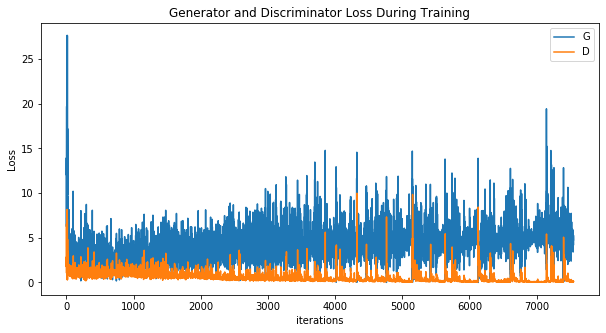

In [0]:



plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

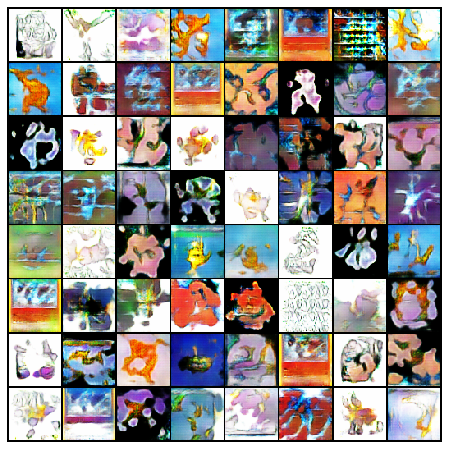

In [0]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

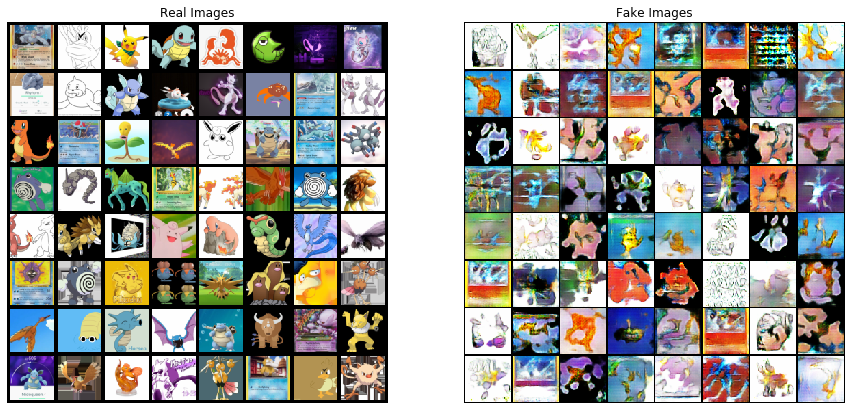

In [0]:

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()